# Install and load libraries required

In [17]:
using Pkg 
# Pkg.add([
#     "CSV", 
#     "DataFrames", 
#     "Statistics", 
#     "StatsBase", 
#     "Plots", 
#     "StatsPlots", 
#     "Dates", 
#     "LinearAlgebra", 
#     "MultivariateStats", 
#     "Clustering", 
#     "Distributions",
#     "HypothesisTests",           
#     "GLM",            
#     "Markdown"
# ])

In [18]:
using CSV
using DataFrames
using Statistics
using StatsBase
using Plots
using StatsPlots
using Dates
using LinearAlgebra
using MultivariateStats
using Clustering
using Distributions
using HypothesisTests
using GLM
using Markdown

In [19]:
include("eda_utils.jl") 

Libraries loaded successfully!


organize_features

In [20]:
# Set plot defaults for publication-quality figures
gr()
default(size=(1000, 600), dpi=300, legend=:best, 
        guidefontsize=12, tickfontsize=10, titlefontsize=14)

println("Libraries loaded successfully!")

Libraries loaded successfully!


# SECTION 1: DATA LOADING AND INITIAL INSPECTION

In [21]:
tracks, features = load_datasets() # adjust paths if needed 

# Generate quality reports
tracks_missing = data_quality_report(tracks, "TRACKS")
features_missing = data_quality_report(features, "FEATURES")


=== Loading Datasets ===


Tracks shape: (106574, 53)
Features shape: (106575, 519)



DATA QUALITY REPORT: TRACKS

Dimensions: 106574 rows × 53 columns

Missing Values Analysis:

Top 10 columns with missing values:
  1. track_lyricist_Column49: 106093 (99.55%)
  2. track_publisher_Column51: 105140 (98.65%)
  3. track_information_Column44: 104065 (97.65%)
  4. track_composer_Column36: 102739 (96.4%)
  5. artist_active_year_end_Column16: 101199 (94.96%)
  6. artist_wikipedia_page_Column31: 100993 (94.76%)
  7. track_date_recorded_Column38: 100415 (94.22%)
  8. artist_related_projects_Column28: 93422 (87.66%)
  9. artist_associated_labels_Column17: 92303 (86.61%)
  10. track_language_code_Column46: 91550 (85.9%)

Data Types Distribution:


  Union{Missing, String}: 17 columns
  Int64: 16 columns
  Union{Missing, String31}: 8 columns
  String: 6 columns
  Union{Missing, Float64}: 2 columns
  String31: 1 columns
  Union{Missing, String3}: 1 columns
  String7: 1 columns
  String15: 1 columns

DATA QUALITY REPORT: FEATURES

Dimensions: 106575 rows × 519 columns

Missing Values Analysis:

Top 10 columns with missing values:
  1. spectral_contrast_skew_06: 1 (0.0%)
  2. mfcc_kurtosis_02: 1 (0.0%)
  3. chroma_cens_kurtosis_08: 1 (0.0%)
  4. chroma_cqt_max_10: 1 (0.0%)
  5. mfcc_std_04: 1 (0.0%)
  6. chroma_cens_mean_04: 1 (0.0%)
  7. mfcc_max_16: 1 (0.0%)
  8. spectral_contrast_median_05: 1 (0.0%)
  9. chroma_cens_median_05: 1 (0.0%)
  10. mfcc_kurtosis_14: 1 (0.0%)

Data Types Distribution:
  Union{Missing, Float64}: 518 columns
  String15: 1 columns


Dict{String, Int64} with 518 entries:
  "spectral_contrast_skew_06"   => 1
  "mfcc_kurtosis_02"            => 1
  "chroma_cens_kurtosis_08"     => 1
  "chroma_cqt_max_10"           => 1
  "mfcc_std_04"                 => 1
  "chroma_cens_mean_04"         => 1
  "mfcc_max_16"                 => 1
  "spectral_contrast_median_05" => 1
  "chroma_cens_median_05"       => 1
  "mfcc_kurtosis_14"            => 1
  "spectral_contrast_skew_02"   => 1
  "chroma_cqt_std_05"           => 1
  "tonnetz_median_01"           => 1
  "mfcc_skew_16"                => 1
  "mfcc_max_19"                 => 1
  "spectral_contrast_min_02"    => 1
  "spectral_contrast_max_07"    => 1
  "tonnetz_std_01"              => 1
  "chroma_cens_max_01"          => 1
  ⋮                             => ⋮

Regarding the results of this section, it is sure to state that the dataset is compound by 106K tracks and 519 audio features. The tracks metadata is severely sparse due to fields like lyricist, publisher... However, the audio features has almost no missing values across all its features. 

# SECTION 2: TRACKS METADATA ANALYSIS



TEMPORAL ANALYSIS

Available date columns:
  - album_date_created_Column3
  - album_date_released_Column4
  - artist_date_created_Column20
  - track_date_created_Column37
  - track_date_recorded_Column38

Track Creation Date Range:
  Earliest: 2008-11-25 17:49:06
  Latest: 2017-03-30 15:23:39
  Total tracks with dates: 106574

Could not parse any valid dates from the data
Sample date values: String31["2008-11-26 01:48:12", "2008-11-26 01:48:14", "2008-11-26 01:48:20", "2008-11-25 17:49:06", "2008-11-26 01:48:56"]

GENRE ANALYSIS

Genre columns found: ["track_genre_top_Column41", "track_genres_Column42", "track_genres_all_Column43"]

Top 15 Genres by Track Count:


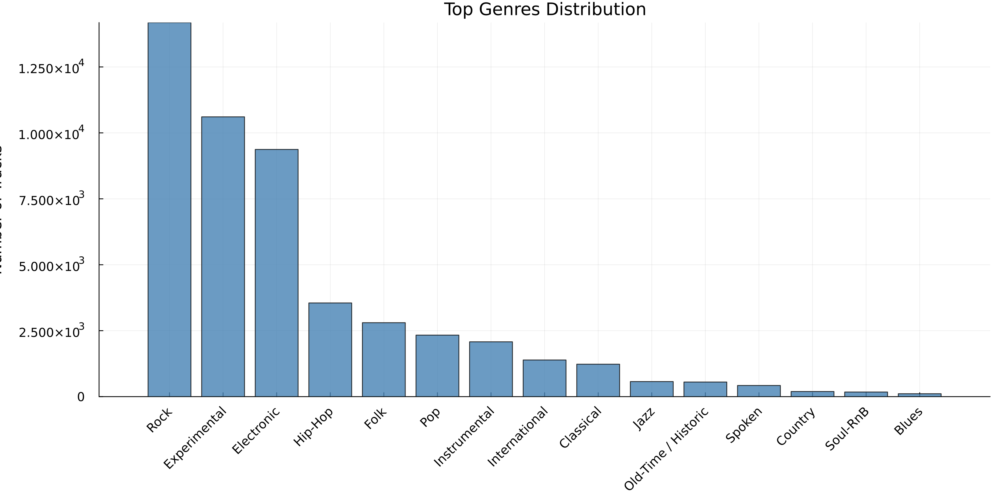

  1. Rock: 14182 tracks (28.59%)
  2. Experimental: 10608 tracks (21.39%)
  3. Electronic: 9372 tracks (18.9%)
  4. Hip-Hop: 3552 tracks (7.16%)
  5. Folk: 2803 tracks (5.65%)
  6. Pop: 2332 tracks (4.7%)
  7. Instrumental: 2079 tracks (4.19%)
  8. International: 1389 tracks (2.8%)
  9. Classical: 1230 tracks (2.48%)
  10. Jazz: 571 tracks (1.15%)
  11. Old-Time / Historic: 554 tracks (1.12%)
  12. Spoken: 423 tracks (0.85%)
  13. Country: 194 tracks (0.39%)
  14. Soul-RnB: 175 tracks (0.35%)
  15. Blues: 110 tracks (0.22%)


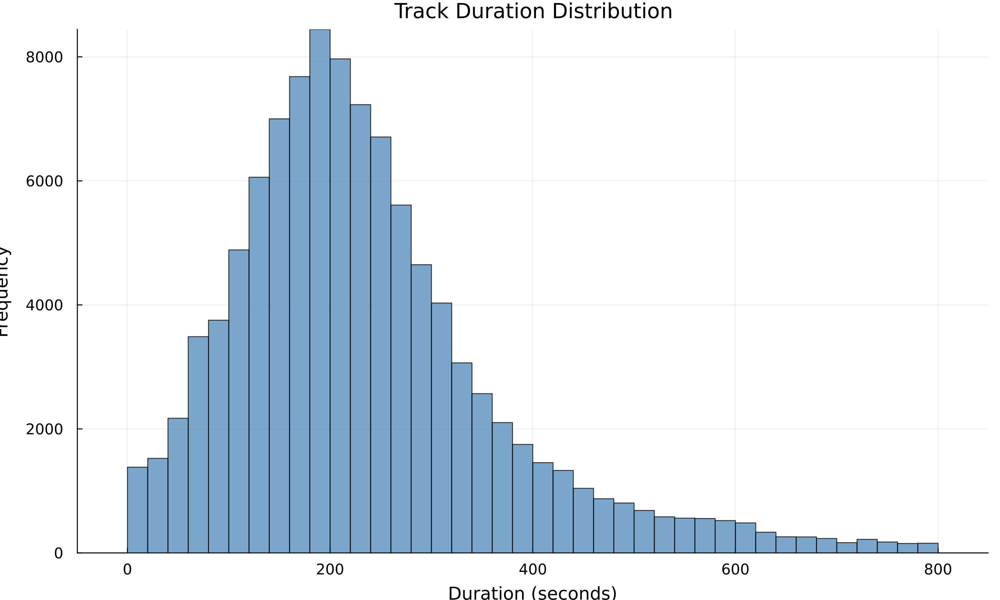


✓ Saved: genre_distribution.png

DURATION ANALYSIS

Duration Statistics (seconds):
  Count: 106558
  Mean: 277.89
  Median: 216.0
  Std Dev: 305.52
  Min: 1.0
  Max: 18350.0
  25th Percentile: 149.0
  75th Percentile: 306.0

Total Duration:
  Hours: 8225.41
  Days: 342.73

✓ Saved: duration_distribution.png

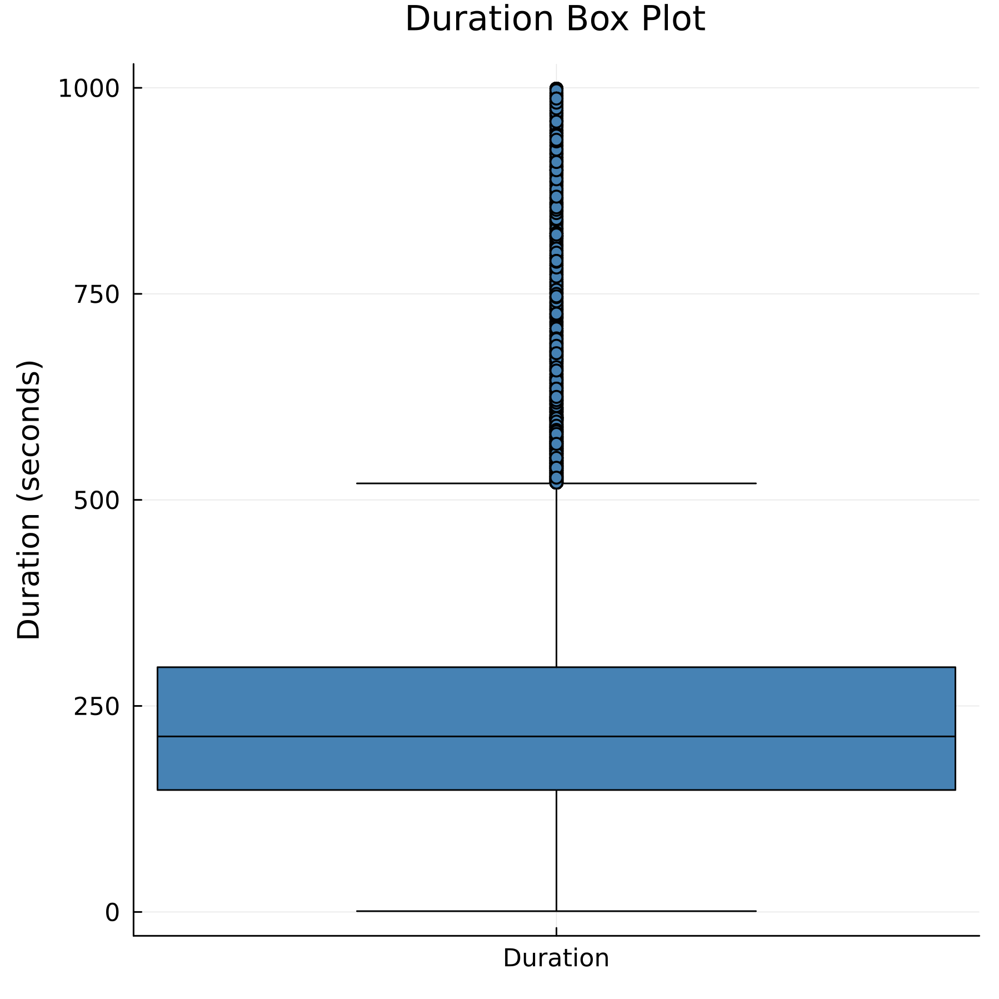

✓ Saved: duration_boxplot.png


In [22]:
# Execute metadata analysis
analyze_temporal_patterns(tracks)
genre_distribution = analyze_genres(tracks)
analyze_duration(tracks)

# SECTION 3: AUDIO FEATURES ANALYSIS


Feature Groups Created:
  zcr: 7 features
  chroma: 252 features
  spectral: 70 features
  other: 49 features
  mfcc: 140 features



FEATURE STATISTICS

zcr Features:
  Count: 7
  Mean range: [0.0023, 29.4646]
  Std range: [0.0052, 88.9754]

chroma Features:


  Count: 252
  Mean range: [-0.3651, 0.9999]
  Std range: [0.0054, 72.0719]



spectral Features:
  Count: 70
  Mean range: [-0.4212, 9249.8729]
  Std range: [0.2921, 1278.5184]

other Features:
  Count: 49
  Mean range: [-0.3073, 12.8843]
  Std range: [0.0061, 32.5827]

mfcc Features:

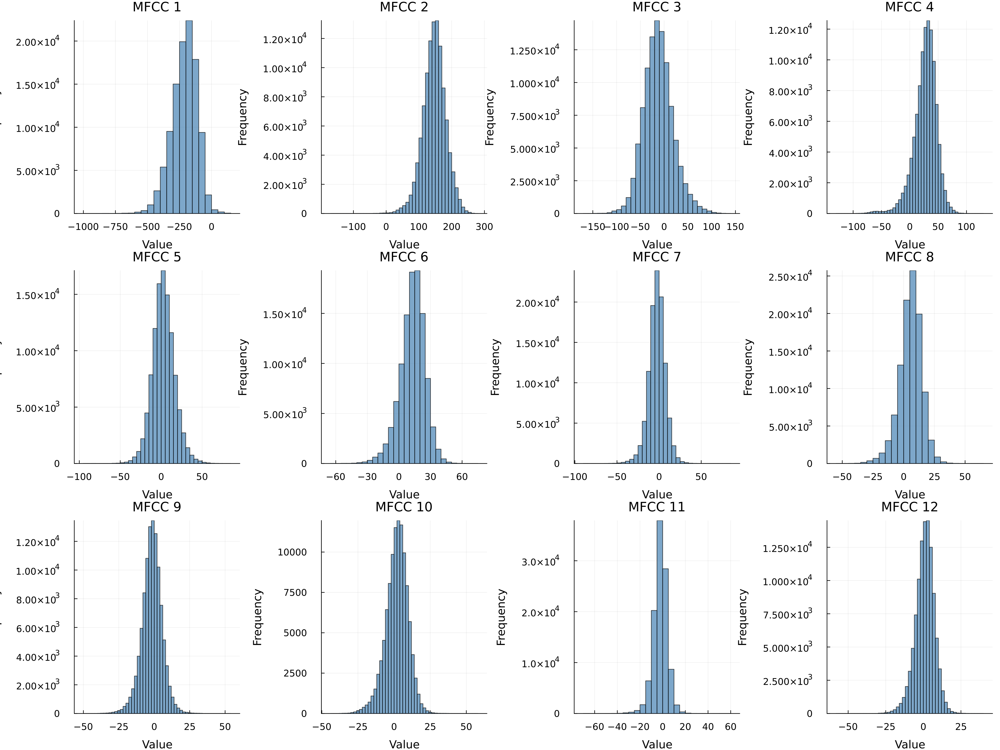


  Count: 140
  Mean range: [-525.5447, 234.038]
  Std range: [0.3245, 105.3886]

FEATURE DISTRIBUTION VISUALIZATION


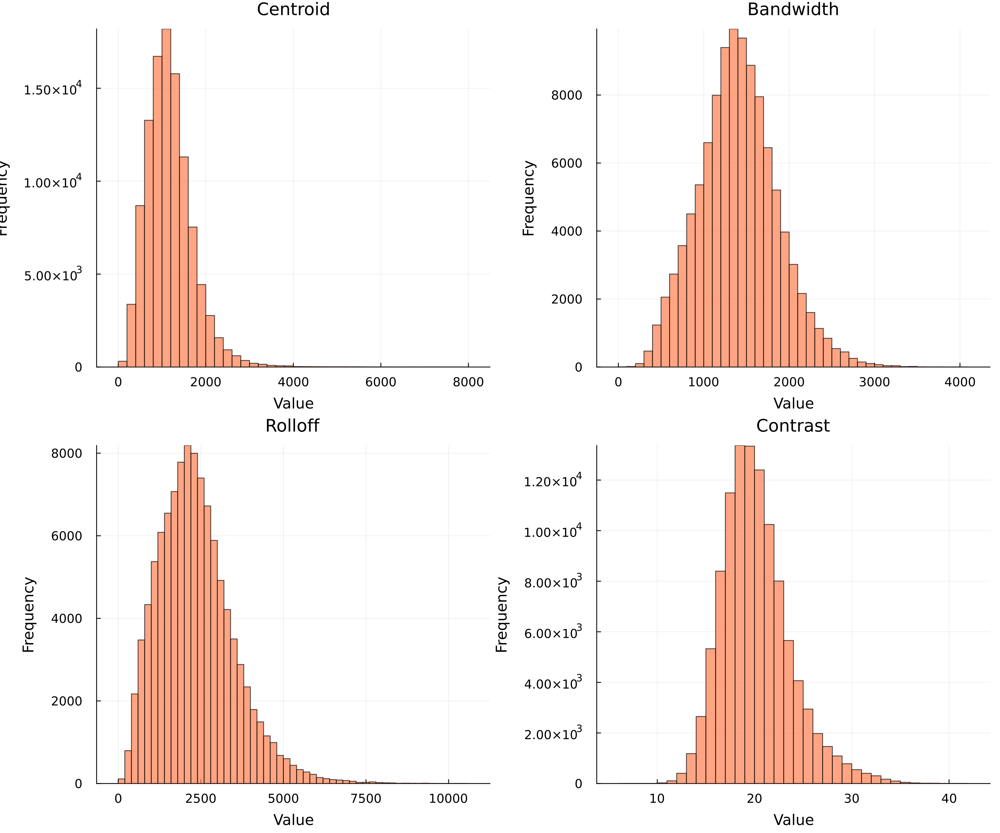

✓ Saved: mfcc_distributions.png
✓ Saved: spectral_features.png


FEATURE CORRELATION ANALYSIS

Highly Correlated Feature Pairs (|r| > 0.8):


  None found


In [23]:
# Execute feature analysis
feature_groups = organize_features(features)
feature_stats = compute_feature_statistics(features, feature_groups)
visualize_feature_distributions(features, feature_groups)
analyze_feature_correlations(features, feature_groups)

# SECTION 4: ADVANCED MULTIVARIATE ANALYSIS



PRINCIPAL COMPONENT ANALYSIS


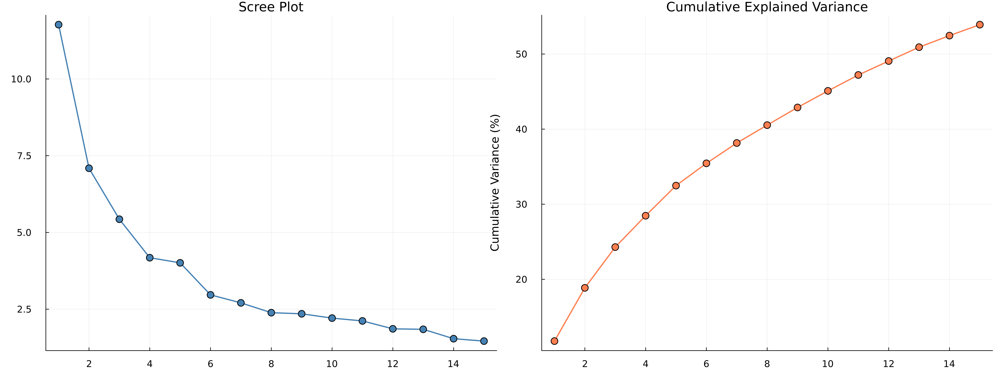


Explained Variance by Component:
  PC1: 11.77% (Cumulative: 11.77%)
  PC2: 7.09% (Cumulative: 18.86%)
  PC3: 5.43% (Cumulative: 24.29%)
  PC4: 4.18% (Cumulative: 28.47%)
  PC5: 4.01% (Cumulative: 32.48%)
  PC6: 2.97% (Cumulative: 35.45%)
  PC7: 2.71% (Cumulative: 38.15%)
  PC8: 2.39% (Cumulative: 40.54%)
  PC9: 2.35% (Cumulative: 42.89%)
  PC10: 2.21% (Cumulative: 45.1%)
  PC11: 2.12% (Cumulative: 47.21%)
  PC12: 1.86% (Cumulative: 49.07%)
  PC13: 1.84% (Cumulative: 50.92%)
  PC14: 1.54% (Cumulative: 52.46%)
  PC15: 1.46% (Cumulative: 53.92%)


✓ Saved: pca_analysis.png



CLUSTERING ANALYSIS


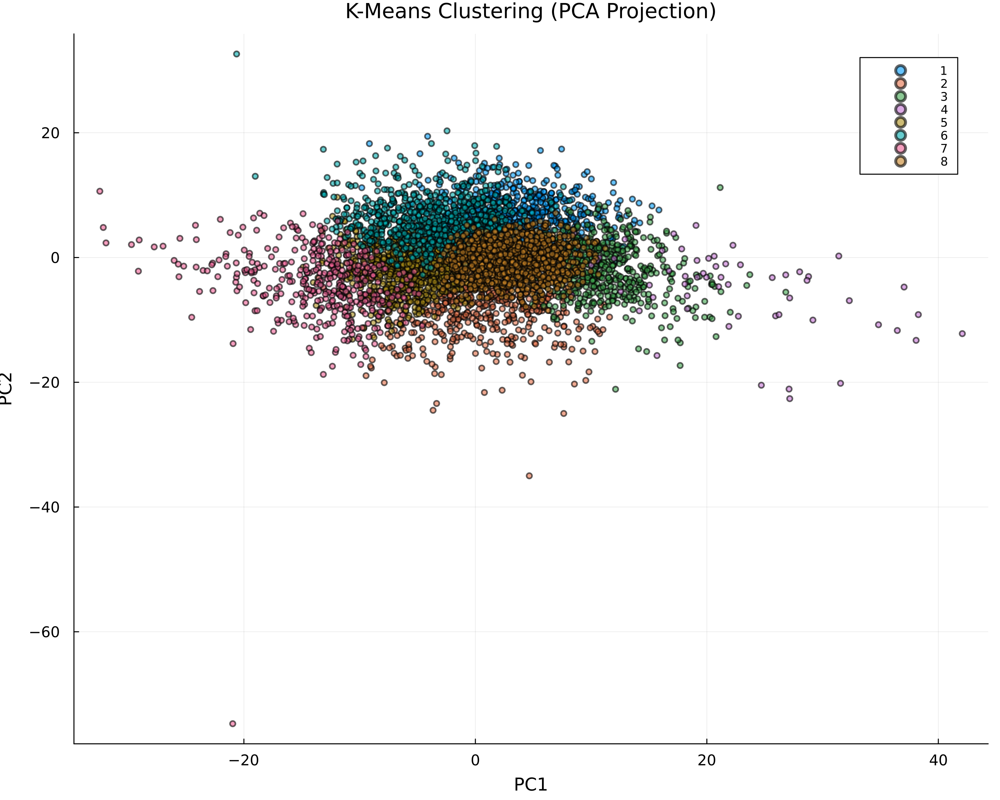


Clustering Results:
  Number of clusters: 8
  Converged: true
  Iterations: 45

Cluster Sizes:
  Cluster 1: 699 samples (13.98%)
  Cluster 2: 460 samples (9.2%)
  Cluster 3: 527 samples (10.54%)
  Cluster 4: 57 samples (1.14%)
  Cluster 5: 907 samples (18.14%)
  Cluster 6: 810 samples (16.2%)
  Cluster 7: 406 samples (8.12%)
  Cluster 8: 1134 samples (22.68%)


✓ Saved: clustering_analysis.png


KmeansResult{Matrix{Float64}, Float64, Int64}([0.004493386315566281 0.33486118522899466 … -0.08308234305012047 -0.028462800244788228; 0.017692596325522534 0.2316617005120495 … -0.13484336513108147 -0.004964589391954147; … ; -0.04645057705055616 0.29802465420939545 … 0.1368855165240097 -0.1991473028458212; 0.40251302298307373 -0.6805878952375757 … -0.19631997452438035 -0.15091135567703792], [7, 8, 2, 6, 3, 3, 2, 5, 6, 3  …  2, 5, 8, 7, 5, 3, 3, 3, 8, 6], [450.40403080637714, 177.19090133716418, 611.5147630030592, 146.91308110792284, 1373.8678512112879, 309.4289227247891, 881.650175392123, 569.1782106121168, 226.53171670950405, 271.336774136435  …  560.4374413999252, 392.7861019919598, 274.14501483857623, 693.416883241831, 730.9613913578778, 514.5520924151754, 766.5187035035107, 325.59202168835816, 213.84276039514413, 171.77106074664533], [699, 460, 527, 57, 907, 810, 406, 1134], [699, 460, 527, 57, 907, 810, 406, 1134], 2.158546257969858e6, 45, true)

In [25]:
# Execute advanced analysis
pca_model, pca_data = perform_pca_analysis(features, 15)
clustering_result = perform_clustering_analysis(features, 8)

Attending to the small PCA analysis, the dataset has genuine high-dimensional complexity as the features are non-redundant and capture different aspects of audio content. The clustering analysis suggest that the audio feature space is relatively homogeneous with a few outliers, which aligns with the PCA finding of distributed variance across many components. 

# SECTION 5: GENRE-BASED ANALYSIS



GENRE-BASED FEATURE COMPARISON


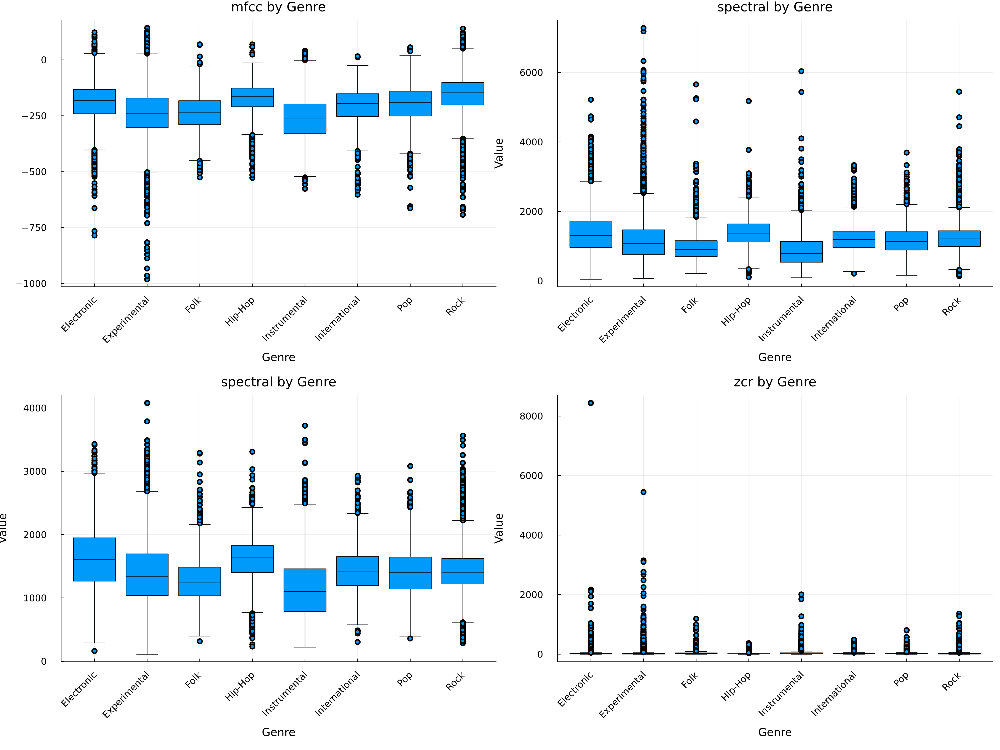


Analyzing top 8 genres
  1. Rock: 14182 tracks
  2. Experimental: 10608 tracks
  3. Electronic: 9372 tracks
  4. Hip-Hop: 3552 tracks
  5. Folk: 2803 tracks
  6. Pop: 2332 tracks
  7. Instrumental: 2079 tracks
  8. International: 1389 tracks



✓ Saved: genre_feature_comparison.png


In [26]:
# Execute genre-based analysis
compare_features_by_genre(tracks, features)

# SECTION 6: POPULARITY ANALYSIS


POPULARITY & SUCCESS ANALYSIS
Found popularity metrics: ["listens", "favorites", "comments", "interest"]


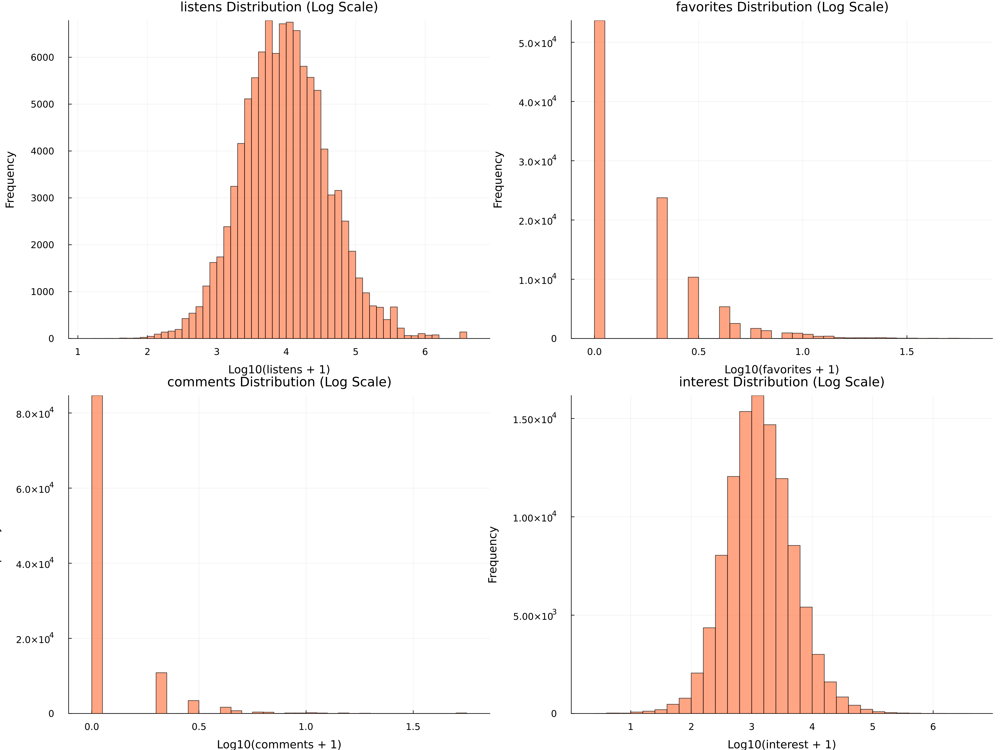

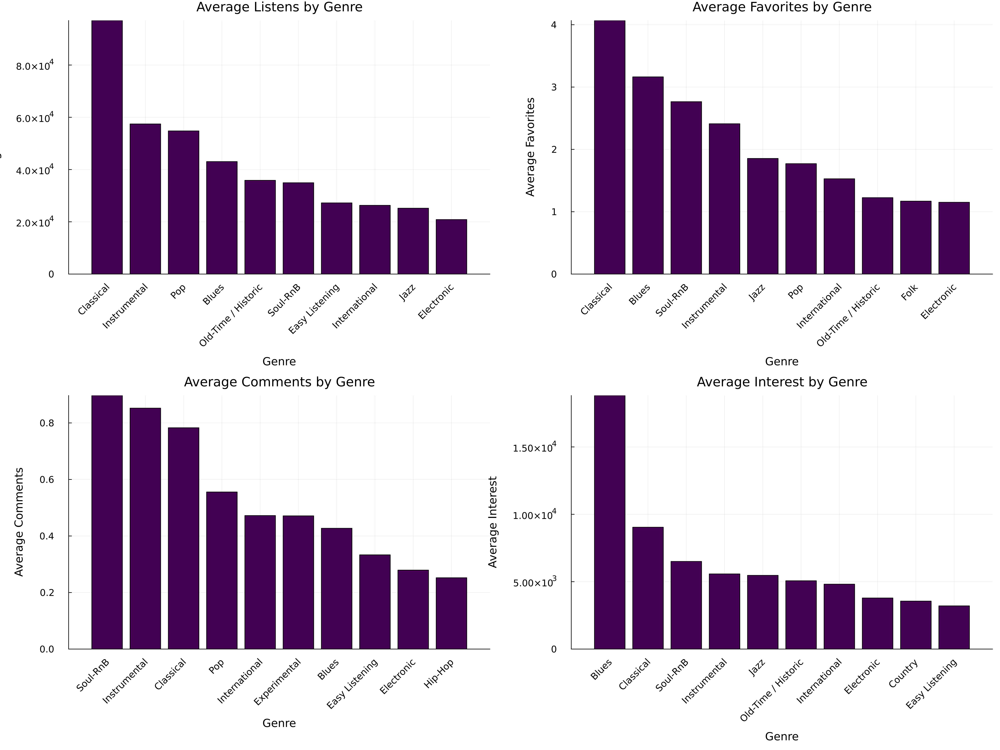

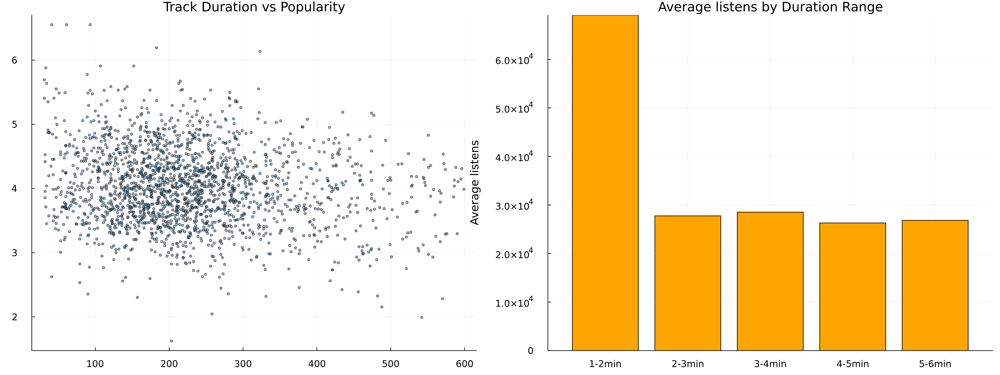


✓ Saved popularity analysis visualizations


In [27]:
# Run the popularity analysis
analyze_popularity_patterns(tracks)

In [40]:
using Plots
using DataFrames

include("../code/general/preprocessing.jl")
include("../code/general/utils_general.jl")




const TRACKS_FILE = "../data/tracks.csv"
const FEATURES_FILE = "../data/features.csv"


# Load and merge data
df = load_and_merge_data(TRACKS_FILE, FEATURES_FILE; selected_tracks_columns=[:listens])
reduced_df = load_and_merge_data(TRACKS_FILE, FEATURES_FILE; selected_tracks_columns=[:listens], selected_features_algorithms=[:mfcc])

listens = df.track_listens

# Low (0-33), Medium (34-66), High (67-100)
p33 = quantile(listens, 0.5)
p66 = quantile(listens, 0.9)
function create_popularity_class(listen_count)
    if listen_count <= p33
        return "Low"
    elseif listen_count <= p66
        return "Medium"
    else
        return "High"
    end
end

features_df = extract_features(df)
reduced_features_df = extract_features(reduced_df)
inputs = Matrix{Float64}(features_df)
reduced_inputs = Matrix{Float64}(reduced_features_df)

inputs = Matrix{Float64}(features_df)
targets = [create_popularity_class(listen) for listen in listens]


println("Input features shape: $(size(inputs))")
println()

# ============================================================================
# TRAIN/TEST SPLIT (Hold-out)
# ============================================================================

println("Step 2: Performing train/test split...")
const RANDOM_SEED = 1234
Random.seed!(RANDOM_SEED)
const TEST_RATIO = 0.3
const rng = MersenneTwister(RANDOM_SEED)

(trainIndexes, testIndexes) = holdOut(size(inputs, 1), TEST_RATIO, rng)

train_inputs = inputs[trainIndexes, :]
train_targets = targets[trainIndexes]
test_inputs = inputs[testIndexes, :]
test_targets = targets[testIndexes]


# 1. Preparar los datos
# MultivariateStats espera una matriz de (features × samples), por lo que trasponemos el DataFrame
# Asumo que train_inputs es tu DataFrame de características y train_targets son las etiquetas
X = Matrix(train_inputs)' 
y = train_targets

# 2. Ajustar el modelo LDA reduciendo a 2 dimensiones
# outdim=2 es clave para el gráfico 2D
lda_model = fit(MulticlassLDA, X, y; outdim=2)

# 3. Proyectar los datos al nuevo espacio 2D
X_lda = predict(lda_model, X)

# 4. Generar el gráfico
p_lda = scatter(
    X_lda[1, :], X_lda[2, :], 
    group=y,                       # Agrupa los colores por tus clases
    title="Proyección LDA (Separación de Clases)",
    xlabel="Discriminante Lineal 1",
    ylabel="Discriminante Lineal 2",
    alpha=0.6,                     # Transparencia para ver la densidad
    markerstrokewidth=0,
    legend=:outertopright
)

display(p_lda)
savefig("lda_separation_plot.png")

Input features shape: (106574, 518)

Step 2: Performing train/test split...


ErrorException: cannot declare Main.rng constant; it already has a value

In [41]:
using Plots
using DataFrames
using Statistics
using Random

# Asegúrate de que preprocessing.jl ya tiene los arreglos de LDA_MLJ y el typo corregidos
include("../code/general/preprocessing.jl")
include("../code/general/utils_general.jl")

const TRACKS_FILE = "../data/tracks.csv"
const FEATURES_FILE = "../data/features.csv"

# --- 1. Carga de Datos ---
df = load_and_merge_data(TRACKS_FILE, FEATURES_FILE; selected_tracks_columns=[:listens])
reduced_df = load_and_merge_data(TRACKS_FILE, FEATURES_FILE; selected_tracks_columns=[:listens], selected_features_algorithms=[:mfcc])
listens = df.track_listens

# --- 2. Crear Etiquetas de Texto (Strings) ---
# Usamos Strings directamente, apply_lda_mlj lo prefiere así.
p50 = quantile(listens, 0.5)
p90 = quantile(listens, 0.9)

function create_popularity_class(listen_count)
    if listen_count <= p50
        return "Low"
    elseif listen_count <= p90
        return "Medium"
    else
        return "High"
    end
end

features_df = extract_features(df)
inputs = Matrix{Float64}(features_df)

# Targets son STRINGS ("Low", "Medium", "High")
targets = [create_popularity_class(listen) for listen in listens]

println("Input features shape: $(size(inputs))")

# --- 3. Split Train/Test ---
println("Step 2: Performing train/test split...")
const RANDOM_SEED = 1234
const TEST_RATIO = 0.3
const rng = MersenneTwister(RANDOM_SEED)

(trainIndexes, testIndexes) = holdOut(size(inputs, 1), TEST_RATIO, rng)

train_inputs = inputs[trainIndexes, :]
train_targets = targets[trainIndexes] # Vector{String}

normalizeMinMax!(train_inputs)
println(train_inputs[1:3,:])


# --- 4. Aplicar LDA con MLJ ---
# Nota: No transponemos la matriz. MLJ espera (Samples x Features).
# Pasamos train_targets que ya es Vector{String}.
println("Step 3: Training LDA via MLJ wrapper...")

# apply_lda_mlj devuelve (datos_transformados, la_maquina_entrenada)
X_lda, lda_machine = apply_lda_mlj(train_inputs, train_targets; outdim=2)

# --- 5. Gráfico ---
println("Step 4: Plotting...")

# IMPORTANTE: MLJ devuelve una matriz (Muestras x Features).
# Por eso usamos [:, 1] y [:, 2] (todas las filas, columna 1 y 2).
p_lda = scatter(
    X_lda[:, 1], X_lda[:, 2], 
    group=train_targets,           # Agrupa automáticamente usando los strings ("High", "Low"...)
    title="Proyección LDA (MLJ Wrapper)",
    xlabel="Discriminante 1",
    ylabel="Discriminante 2",
    alpha=0.6,
    markerstrokewidth=0,
    legend=:outertopright
)

display(p_lda)
savefig("lda_separation_plot_mlj.png")

Input features shape: (106574, 518)
Step 2: Performing train/test split...


ErrorException: cannot declare Main.rng constant; it already has a value

In [42]:
using Plots
using DataFrames
using Statistics
using Random

# Asegúrate de que en preprocessing.jl también arreglaste PCA_MLJ (igual que hicimos con LDA_MLJ)
include("../code/general/preprocessing.jl")
include("../code/general/utils_general.jl")

const TRACKS_FILE = "../data/tracks.csv"
const FEATURES_FILE = "../data/features.csv"

# --- 1. Carga de Datos ---
df = load_and_merge_data(TRACKS_FILE, FEATURES_FILE; selected_tracks_columns=[:listens])
listens = df.track_listens

# --- 2. Crear Etiquetas ---
p50 = quantile(listens, 0.5) # Ajustado a tu código anterior
p90 = quantile(listens, 0.9)

function create_popularity_class(listen_count)
    if listen_count <= p50
        return "Low"
    elseif listen_count <= p90
        return "Medium"
    else
        return "High"
    end
end

features_df = extract_features(df)
inputs = Matrix{Float64}(features_df)
targets = [create_popularity_class(listen) for listen in listens]

println("Input features shape: $(size(inputs))")

# --- 3. Split Train/Test ---
println("Step 2: Performing train/test split...")
const RANDOM_SEED = 1234
const TEST_RATIO = 0.3
rng = MersenneTwister(RANDOM_SEED)

(trainIndexes, testIndexes) = holdOut(size(inputs, 1), TEST_RATIO, rng)

train_inputs = inputs[trainIndexes, :]
train_targets = targets[trainIndexes]

# --- 4. Normalización ---
println("Step 3: Normalizing data...")
normalizeMinMax!(train_inputs)
# Opcional: Si MinMax no mejora, prueba a usar Z-score (Standardizer de MLJ)
# train_inputs = MLJ.transform(MLJ.fit!(MLJ.machine(MLJ.Standardizer(), train_inputs)), train_inputs)

# --- 5. Aplicar PCA (MLJ Wrapper) ---
println("Step 4: Training PCA via MLJ wrapper...")

# IMPORTANTE: PCA es NO supervisado. Solo pasamos los inputs, NO los targets.
# maxoutdim=2 para poder graficar en 2D.
X_pca, pca_machine = apply_pca_mlj(train_inputs; maxoutdim=2)

# --- 6. Gráfico ---
println("Step 5: Plotting PCA...")

# MLJ devuelve (Samples x Features), por eso usamos [:, 1] y [:, 2]
p_pca = scatter(
    X_pca[:, 1], X_pca[:, 2], 
    group=train_targets,            # Usamos los targets SOLO para colorear
    title="Proyección PCA (Varianza de Características)",
    xlabel="Componente Principal 1",
    ylabel="Componente Principal 2",
    alpha=0.6,
    markerstrokewidth=0,
    legend=:outertopright
)

display(p_pca)
savefig("pca_variance_plot.png")

Input features shape: (106574, 518)


Step 2: Performing train/test split...


Step 3: Normalizing data...


Step 4: Training PCA via MLJ wrapper...


MethodError: MethodError: no method matching PCA(; maxoutdim::Int64)
The type `PCA` exists, but no method is defined for this combination of argument types when trying to construct it.

Closest candidates are:
  PCA(!Matched::AbstractVector{T}, !Matched::AbstractMatrix{T}, !Matched::AbstractVector{T}, !Matched::T, !Matched::T) where T<:Real got unsupported keyword argument "maxoutdim"
   @ MultivariateStats C:\Users\Pablo\.julia\packages\MultivariateStats\u1yuF\src\pca.jl:7
  PCA(!Matched::AbstractVector{T}, !Matched::AbstractMatrix{T}, !Matched::AbstractVector{T}, !Matched::T) where T<:Real got unsupported keyword argument "maxoutdim"
   @ MultivariateStats C:\Users\Pablo\.julia\packages\MultivariateStats\u1yuF\src\pca.jl:16


In [31]:
using Plots
using DataFrames
using Statistics
using Random

# Asegúrate de que en preprocessing.jl también arreglaste PCA_MLJ (igual que hicimos con LDA_MLJ)
include("../code/general/preprocessing.jl")
include("../code/general/utils_general.jl")

const TRACKS_FILE = "../data/tracks.csv"
const FEATURES_FILE = "../data/features.csv"

# --- 1. Carga de Datos ---
df = load_and_merge_data(TRACKS_FILE, FEATURES_FILE; selected_tracks_columns=[:listens])
listens = df.track_listens

# --- 2. Crear Etiquetas ---
p50 = quantile(listens, 0.5) # Ajustado a tu código anterior
p90 = quantile(listens, 0.9)

function create_popularity_class(listen_count)
    if listen_count <= p50
        return "Low"
    elseif listen_count <= p90
        return "Medium"
    else
        return "High"
    end
end

features_df = extract_features(df)
inputs = Matrix{Float64}(features_df)
targets = [create_popularity_class(listen) for listen in listens]

println("Input features shape: $(size(inputs))")

# --- 3. Split Train/Test ---
println("Step 2: Performing train/test split...")
const RANDOM_SEED = 1234
const TEST_RATIO = 0.3
rng = MersenneTwister(RANDOM_SEED)

(trainIndexes, testIndexes) = holdOut(size(inputs, 1), TEST_RATIO, rng)

train_inputs = inputs[trainIndexes, :]
train_targets = targets[trainIndexes]

# --- 4. Normalización (CAMBIO IMPORTANTE) ---
println("Step 3: Standardizing data (Z-Score)...")

# En lugar de MinMax, usamos Standardizer. 
# Esto centra los datos en 0 y hace que la desviación típica sea 1.
# Es mucho mejor para PCA/LDA en audio.
stand_model = Standardizer()
mach_stand = machine(stand_model, train_inputs) |> MLJ.fit!
train_inputs_scaled = MLJ.transform(mach_stand, train_inputs)

# --- 5. Aplicar PCA ---
println("Step 4: Training PCA via MLJ wrapper...")

# Usamos la variable 'train_inputs_scaled'
X_pca, pca_machine = apply_pca_mlj(train_inputs_scaled; maxoutdim=2)

# --- 6. Gráfico ---
println("Step 5: Plotting PCA...")
p_pca = scatter(
    X_pca[:, 1], X_pca[:, 2], 
    group=train_targets,
    title="Proyección PCA (Datos Estandarizados)",
    xlabel="Componente 1",
    ylabel="Componente 2",
    alpha=0.5,
    markerstrokewidth=0,
    legend=:outertopright
)

display(p_pca)
savefig("pca_standardized.png")

import MLJMultivariateStatsInterface ✔


┌ Info: For silent loading, specify `verbosity=0`. 
└ @ Main C:\Users\Pablo\.julia\packages\MLJModels\ziReN\src\loading.jl:159


LoadError: LoadError: cannot assign a value to imported variable MultivariateStats.PCA from module Main
in expression starting at c:\Users\Pablo\Documents\Master Inteligencia Artifical\Aprendizaje Automatico\Laboratoy\Proyecto final\code\general\preprocessing.jl:9